# This notebook

In this notebook, we exlore the co-occurrence of keywords and a set of important and/or emerging words across the three lockdown-defined time windows to detect patterns of change in co-occurrence.

Temporal windows are defined according to key events in the timeline of covid19 pandemic in the UK:

- up to 23 March 2020 (excluded): pre-lockdown
- 23 March to 10 May 2020: strict lockdown
- 11 May 2020 onwards: post- strict lockdown (lockdown eases)



We will:

- [co-occurrence] For each temporal window, calculate the co-occurrence of keyword and word pairs as Dice coefficient 
- Identify changes in keyword and emerging words co-occurrence across the temporal windows.
- Create networks of keyword co-occurrences for each of the three temporal windows and compare network and nodes characteristics across the three.


## Settings

In [1]:
import os

In [2]:
import numpy as np

In [3]:
from math import log2

In [4]:
import seaborn as sns
import matplotlib.pyplot as plt

In [5]:
import networkx as nx
from operator import itemgetter

In [6]:
%matplotlib inline

In [7]:
from src.news_media.get_keywords_trend import *

/Users/alessiatosi/DS_projects/behavioural-sci-perception/docs/ext/keywords.yaml has been successfully loaded as a dict
/Users/alessiatosi/DS_projects/behavioural-sci-perception/docs/ext/subkw_to_kw_map.yaml has been successfully loaded as a dict


In [8]:
pd.set_option('display.max_colwidth', None)

The config file

In [9]:
CONFIG.keys()

dict_keys(['NgramRange', 'Actors', 'BehavSci', 'Behav_ins', 'Behav_chan', 'Behav_pol', 'Behav_anal', 'Psych', 'Econ_behav', 'Econ_irrational', 'Nudge', 'Nudge_choice', 'Nudge_pater', 'Covid', 'Fatigue', 'Immunity'])

In [10]:
DIR_DATA = os.environ.get("DIR_DATA_INTERIM")

In [11]:
DIR_DATA_EXTRA = os.environ.get("DIR_DATA_EXTRA")

In [12]:
# prominence
term_freqs_nm = "kword_rawfreq.csv"
doc_freqs_nm = "kword_yn_occurrence.csv"

In [13]:
# keywords to be excluded because of low frequency in the corpus
EXCLUDE_KWORDS = ['behav_insight', 'behavioural_economist', 'behav_analysis', 'chater']

In [14]:
# we kept in some important words that though are not keywords
KEY_WORDS = ['herd_immunity', 'behavioural_fatigue']

In [15]:
# part of top 50 words to emerge based on frequency across the whole period
EMERGING_WORDS = ['government', 'health','coronavirus','virus','covid-19','johnson','measures',
 'lockdown','sage','advice','cases','minister','professor','pandemic','risk','ministers',
 'uk','scientists','deaths','crisis','distancing','disease','cummings','restrictions','experts',
 'data','evidence','public','england','strategy', 'response']

## Import document and term frequencies of keywords

In [16]:
doc_freqs = pd.read_csv(os.path.join(DIR_DATA, doc_freqs_nm))

## Remove low frequency keywords

In [17]:
doc_freqs.drop(EXCLUDE_KWORDS, axis=1, inplace=True)

In [18]:
doc_freqs

,Unnamed: 0,pub_date_dt,article_id,word_count,american_behav_scientists,behav_change,behav_econ,behav_insights_team,behav_science,behav_scientist,behavioural_fatigue,halpern,herd_immunity,michie,nudge,psychologist,psychology,spi-b
0,0,2020-02-03,b1_10,191,0,0,1,0,0,0,0,0,0,0,1,0,0,0
1,1,2020-03-14,b1_101,1638,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,2,2020-03-14,b1_102,199,0,0,0,0,0,0,0,0,1,0,1,0,0,0
3,3,2020-03-14,b1_103,293,0,0,0,0,1,0,0,0,1,0,0,0,0,0
4,4,2020-03-14,b1_104,313,0,0,0,1,1,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
642,642,2020-06-14,b2_95,874,0,0,0,0,1,0,0,0,0,0,0,0,0,0
643,643,2020-06-23,b2_96,319,0,0,0,0,1,0,0,0,0,0,0,0,1,0
644,644,2020-07-06,b2_97,529,0,0,0,0,0,1,0,0,0,0,0,0,0,0
645,645,2020-06-29,b2_98,321,0,0,0,0,0,1,0,0,0,0,0,1,0,0


## Import nouns per article
This is data used to derive the document frequency of the emerging words

In [19]:
uk_news = NewsArticles()

(1968, 13)
647
(1968, 13)
647
Index(['Unnamed: 0', 'article_id', 'title', 'pub_date', 'full_text',
       'subkword', 'opinion_context', 'opinion_context_id',
       'keyword_sentiment', 'refers_to_gov', 'gov_sentiment', 'kword',
       'pub_date_dt'],
      dtype='object')
647


In [ ]:
dir(uk_news)

Filter for emerging words

In [20]:
emerging_words_freqs = uk_news.allwords_raw_tf[EMERGING_WORDS].copy()

Combine words that refer to the same entity: "covid-19" and "coronavirus"   ** maybe also virus?

In [21]:
emerging_words_freqs['covid'] = emerging_words_freqs['coronavirus'] + emerging_words_freqs['covid-19']

In [22]:
emerging_words_freqs[['covid', 'coronavirus', 'covid-19']].tail()

,,,,covid,coronavirus,covid-19
,pub_date,article_id,word_count,,,
642,2020-05-11,b2_261.0,150,2,2,0
643,2020-05-11,b2_262.0,60,1,1,0
644,2020-05-11,b2_263.0,160,1,1,0
645,2020-05-31,b2_264.0,286,2,0,2
646,2020-05-11,b2_265.0,124,1,1,0


In [23]:
emerging_words_freqs.drop(['coronavirus', 'covid-19'], axis=1, inplace=True)

In [24]:
emerging_words_freqs.shape

(647, 30)

### Calculate document frequency for emerging words

In [25]:
emerging_words_freqs.columns

Index(['government', 'health', 'virus', 'johnson', 'measures', 'lockdown',
       'sage', 'advice', 'cases', 'minister', 'professor', 'pandemic', 'risk',
       'ministers', 'uk', 'scientists', 'deaths', 'crisis', 'distancing',
       'disease', 'cummings', 'restrictions', 'experts', 'data', 'evidence',
       'public', 'england', 'strategy', 'response', 'covid'],
      dtype='object')

In [26]:
emerging_words_yn_occurrence = emerging_words_freqs.applymap(lambda cell: 1 if cell > 0 else 0)

In [27]:
emerging_words_yn_occurrence

,,,,government,health,virus,johnson,measures,lockdown,sage,advice,cases,minister,...,cummings,restrictions,experts,data,evidence,public,england,strategy,response,covid
,pub_date,article_id,word_count,,,,,,,,,,,,,,,,,,,,,
0,2020-01-27,b1_6,658,1,1,0,0,1,0,0,1,0,0,...,0,0,1,0,0,0,1,0,0,0
1,2020-01-28,b1_7,194,1,1,0,0,0,0,0,0,1,1,...,0,0,0,0,1,0,0,0,0,0
2,2020-01-29,b1_8,158,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2020-01-29,b1_9,78,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,2020-02-03,b1_10,191,1,1,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
642,2020-05-11,b2_261.0,150,1,1,1,1,0,0,1,1,0,1,...,0,1,0,0,0,0,1,0,0,1
643,2020-05-11,b2_262.0,60,1,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,1
644,2020-05-11,b2_263.0,160,1,1,0,0,1,0,0,0,0,0,...,0,0,0,1,1,0,1,0,0,1


## Combine doc freq of keywords and emerging words in one unique dataset

Join by date and article id

In [28]:
sorted(doc_freqs.article_id.unique()) == sorted(
    emerging_words_yn_occurrence.index.get_level_values('article_id').unique())

True

In [29]:
doc_freqs.drop('Unnamed: 0', axis=1, inplace=True)

In [30]:
# cast date as data format
doc_freqs['pub_date_dt'] = [datetime.strptime(pub_d, '%Y-%m-%d') for pub_d in doc_freqs.pub_date_dt]

In [31]:
emerging_words_yn_occurrence.reset_index(inplace=True)
emerging_words_yn_occurrence.drop('level_0', axis=1, inplace=True)

In [54]:
allwords_doc_freqs = pd.merge(doc_freqs, emerging_words_yn_occurrence, how='outer', 
         left_on=['pub_date_dt','article_id'], right_on = ['pub_date','article_id'],
         validate="1:1")

In [55]:
# check

all([x == y for x,y in zip(allwords_doc_freqs.word_count_x, allwords_doc_freqs.word_count_y)])

True

In [56]:
# only keep one 'word_count' column
allwords_doc_freqs.rename(columns={"word_count_x": "word_count"}, inplace=True)
allwords_doc_freqs.drop('word_count_y', axis=1, inplace=True)

In [57]:
allwords_doc_freqs

,pub_date_dt,article_id,word_count,american_behav_scientists,behav_change,behav_econ,behav_insights_team,behav_science,behav_scientist,behavioural_fatigue,...,cummings,restrictions,experts,data,evidence,public,england,strategy,response,covid
0,2020-02-03,b1_10,191,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
1,2020-03-14,b1_101,1638,0,0,0,0,0,0,0,...,0,1,1,1,0,0,0,1,1,1
2,2020-03-14,b1_102,199,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,2020-03-14,b1_103,293,0,0,0,0,1,0,0,...,0,1,0,1,1,0,0,1,0,1
4,2020-03-14,b1_104,313,0,0,0,1,1,0,0,...,0,0,1,0,0,1,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
642,2020-06-14,b2_95,874,0,0,0,0,1,0,0,...,0,1,1,1,0,0,1,0,1,1
643,2020-06-23,b2_96,319,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
644,2020-07-06,b2_97,529,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
645,2020-06-29,b2_98,321,0,0,0,0,0,1,0,...,0,1,1,1,0,0,0,0,0,1


## Group data into time windows

According to dates: before 23 March, from 23 March to 10 May, from 11 May onwards.

In [58]:
def label_weeks(date):
    """Assigns and labels weeks to a time window."""
    if date <= datetime.strptime("2020-03-22", '%Y-%m-%d'):
        return "before-lockdown"
    if (date > datetime.strptime("2020-03-22", '%Y-%m-%d')) and (date <= datetime.strptime("2020-05-10", '%Y-%m-%d')):
        return "lockdown"
    if date > datetime.strptime("2020-05-10", '%Y-%m-%d'):
        return "post-lockdown"
    

In [59]:
allwords_doc_freqs["time_window"] = allwords_doc_freqs.pub_date_dt.apply(label_weeks)

In [60]:
allwords_doc_freqs

,pub_date_dt,article_id,word_count,american_behav_scientists,behav_change,behav_econ,behav_insights_team,behav_science,behav_scientist,behavioural_fatigue,...,restrictions,experts,data,evidence,public,england,strategy,response,covid,time_window
0,2020-02-03,b1_10,191,0,0,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,before-lockdown
1,2020-03-14,b1_101,1638,0,0,0,0,0,0,0,...,1,1,1,0,0,0,1,1,1,before-lockdown
2,2020-03-14,b1_102,199,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,before-lockdown
3,2020-03-14,b1_103,293,0,0,0,0,1,0,0,...,1,0,1,1,0,0,1,0,1,before-lockdown
4,2020-03-14,b1_104,313,0,0,0,1,1,0,0,...,0,1,0,0,1,0,1,1,1,before-lockdown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
642,2020-06-14,b2_95,874,0,0,0,0,1,0,0,...,1,1,1,0,0,1,0,1,1,post-lockdown
643,2020-06-23,b2_96,319,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,post-lockdown
644,2020-07-06,b2_97,529,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,post-lockdown
645,2020-06-29,b2_98,321,0,0,0,0,0,1,0,...,1,1,1,0,0,0,0,0,1,post-lockdown


In [61]:
allwords_doc_freqs.set_index([allwords_doc_freqs.index, allwords_doc_freqs.pub_date_dt, allwords_doc_freqs.article_id, 
                     allwords_doc_freqs.word_count, allwords_doc_freqs.time_window], inplace=True, drop=True)


In [62]:
allwords_doc_freqs

,,,,,pub_date_dt,article_id,word_count,american_behav_scientists,behav_change,behav_econ,behav_insights_team,behav_science,behav_scientist,behavioural_fatigue,...,restrictions,experts,data,evidence,public,england,strategy,response,covid,time_window
,pub_date_dt,article_id,word_count,time_window,,,,,,,,,,,,,,,,,,,,,
0,2020-02-03,b1_10,191,before-lockdown,2020-02-03,b1_10,191,0,0,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,before-lockdown
1,2020-03-14,b1_101,1638,before-lockdown,2020-03-14,b1_101,1638,0,0,0,0,0,0,0,...,1,1,1,0,0,0,1,1,1,before-lockdown
2,2020-03-14,b1_102,199,before-lockdown,2020-03-14,b1_102,199,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,before-lockdown
3,2020-03-14,b1_103,293,before-lockdown,2020-03-14,b1_103,293,0,0,0,0,1,0,0,...,1,0,1,1,0,0,1,0,1,before-lockdown
4,2020-03-14,b1_104,313,before-lockdown,2020-03-14,b1_104,313,0,0,0,1,1,0,0,...,0,1,0,0,1,0,1,1,1,before-lockdown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
642,2020-06-14,b2_95,874,post-lockdown,2020-06-14,b2_95,874,0,0,0,0,1,0,0,...,1,1,1,0,0,1,0,1,1,post-lockdown
643,2020-06-23,b2_96,319,post-lockdown,2020-06-23,b2_96,319,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,post-lockdown
644,2020-07-06,b2_97,529,post-lockdown,2020-07-06,b2_97,529,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,post-lockdown


In [63]:
allwords_doc_freqs.drop(['pub_date_dt', 'article_id', 'word_count', 'time_window', 'pub_date'], inplace=True, axis=1)

# Co-occurrence

## Separate before-lockdown vs lockdown data

In [64]:
doc_freqs_before = allwords_doc_freqs[allwords_doc_freqs.index.get_level_values('time_window').isin(['before-lockdown'])]
doc_freqs_lock = allwords_doc_freqs[allwords_doc_freqs.index.get_level_values('time_window').isin(['lockdown'])]
doc_freqs_post = allwords_doc_freqs[allwords_doc_freqs.index.get_level_values('time_window').isin(['post-lockdown'])]

# Dice coefficient

We define co-occurrence as two keywords appearing in the same article, regardless of how many times each appears in the articles. So our measure of co-occurrence is based on document co-occurrence.

We normalise co-occurrence by using the Dice coefficient, which is a used in corpus linguistics and should not inflate the importance of co-occurrence for keywords with a very low appearence count in the corpus. That is, words that are frequent by themselves tend to have frequent relations to other words. Other metrics like Dice coefficiet, mutual information orlog-likelihood ratio, will tell if a relation is more frequent than one would expect given the frequency of the individual words.

- The co-occurrence relationship between any two keywords was expressed by the Dice coefficient in information theory (pseudocode shown below), describing the strength of association between these two keywords. 
- The main reason for choosing mutual information instead of selecting the number of frequent words could be analysed by the following process, ADD
- Note that the co-occurrence of two keywords can be relatively small, but if they almost always appeared at the same time, their Dice coefficient will be higher, as they were considered to be in a co-occurrence relationship.

Ref: 
https://onlinelibrary.wiley.com/doi/pdf/10.1002/ecj.10347

https://www.aclweb.org/anthology/C12-2049.pdf

https://www.aclweb.org/anthology/J05-4002.pdf

`Dice coefficient = (2 * count(w1, w2)) / (count(w1) + count(w2))`

The number of co-occurrences multiplied by two divided by the sum of the two keywords' individual document occurrences.

E.g., Given the following document occurrences and co-occurrence: keyword A : 10, keyword B : 6, co-occurrence :4,
the Dice coefficient representing the co-occurrence of A and B is:

In [ ]:
2*4/(10+6)

Compared this to a case where keyword A : 10, keyword B : 6, co-occurrence : 6

In [ ]:
2*6/(10+6)

In [44]:
from itertools import combinations

def calc_dice(yn_occurence_data, kwords_list, prefix=""):
    # keyword document occurrence
    kword_docfreqs = yn_occurence_data.sum(axis=0)
    # keywords co-occurrence matrix
    kword_cooccurences = yn_occurence_data.values.T.dot(yn_occurence_data.values)
    np.fill_diagonal(kword_cooccurences, 0)
    kwords = yn_occurence_data.columns
    kword_cooccurences = pd.DataFrame(kword_cooccurences, index=kwords, columns=kwords)
    kword_cooccurences = kword_cooccurences.stack()
    
    
    def _dice(w1, w2):
        # print(f"{w1}: {kword_docfreqs[w1]}")
        # print(f"{w2}: {kword_docfreqs[w2]}")
        # print(f"coocc: {kword_cooccurences[w1][w2]}")
        try:
            return (2 * kword_cooccurences[w1][w2]) / (kword_docfreqs[w1] + kword_docfreqs[w2])
        except (ValueError, ZeroDivisionError) as err: # one of the two individual counts are 0
            return np.nan
        
    def dice(kwords_list: list) -> list:
        coefs = []
        for pair in combinations(kwords_list, r=2):
            coefs.append((*pair, _dice(*pair), kword_cooccurences[pair[0]][pair[1]], kword_docfreqs[pair[0]], kword_docfreqs[pair[1]] ))
        return coefs
    
    dices = dice(kwords_list=kwords_list)
    dices_df = pd.DataFrame(dices, columns=['source', 'target', f'{prefix}_weight', f'{prefix}_co-occ', f'{prefix}_source_docfreq', f'{prefix}_target_docfreq'])
    
    return dices_df
    

In [66]:
kwords = allwords_doc_freqs.columns.tolist()

In [67]:
kwords

['american_behav_scientists',
 'behav_change',
 'behav_econ',
 'behav_insights_team',
 'behav_science',
 'behav_scientist',
 'behavioural_fatigue',
 'halpern',
 'herd_immunity',
 'michie',
 'nudge',
 'psychologist',
 'psychology',
 'spi-b',
 'government',
 'health',
 'virus',
 'johnson',
 'measures',
 'lockdown',
 'sage',
 'advice',
 'cases',
 'minister',
 'professor',
 'pandemic',
 'risk',
 'ministers',
 'uk',
 'scientists',
 'deaths',
 'crisis',
 'distancing',
 'disease',
 'cummings',
 'restrictions',
 'experts',
 'data',
 'evidence',
 'public',
 'england',
 'strategy',
 'response',
 'covid']

In [68]:
before_dice_coefs = calc_dice(yn_occurence_data=doc_freqs_before, kwords_list=kwords, prefix="bef")

In [69]:
lock_dice_coefs = calc_dice(yn_occurence_data=doc_freqs_lock, kwords_list=kwords, prefix="lock")

In [70]:
post_dice_coefs = calc_dice(yn_occurence_data=doc_freqs_post, kwords_list=kwords, prefix="post")

## How has co-occurrence (as Dice coefficient) evolved before vs. during vs. post lockdown

CHECK : is Dice coefficient a fair representation?

#### Before

In [71]:
before_dice_coefs.sort_values('bef_weight', ascending=False)[:30]

,source,target,bef_weight,bef_co-occ,bef_source_docfreq,bef_target_docfreq
539,government,covid,0.876106,99,116,110
594,virus,covid,0.871287,88,92,110
567,health,covid,0.832579,92,111,110
511,government,health,0.828194,94,116,111
512,government,virus,0.807692,84,116,92
540,health,virus,0.778325,79,111,92
645,measures,covid,0.772487,73,79,110
620,johnson,covid,0.762887,74,84,110
513,government,johnson,0.760000,76,116,84
514,government,measures,0.758974,74,116,79


### During

In [72]:
lock_dice_coefs.sort_values('lock_weight', ascending=False)[:30]

,source,target,lock_weight,lock_co-occ,lock_source_docfreq,lock_target_docfreq
539,government,covid,0.875556,197,218,232
511,government,health,0.868106,181,218,199
567,health,covid,0.830626,179,199,232
594,virus,covid,0.808933,163,171,232
512,government,virus,0.781491,152,218,171
540,health,virus,0.772973,143,199,171
792,pandemic,covid,0.743455,142,150,232
669,lockdown,covid,0.728682,141,155,232
514,government,measures,0.724638,125,218,127
515,government,lockdown,0.718499,134,218,155


#### Post

In [73]:
post_dice_coefs.sort_values('post_weight', ascending=False)[:30]

,source,target,post_weight,post_co-occ,post_source_docfreq,post_target_docfreq
539,government,covid,0.854701,150,173,178
511,government,health,0.833856,133,173,146
567,health,covid,0.808642,131,146,178
600,johnson,minister,0.807882,82,110,93
512,government,virus,0.777027,115,173,123
594,virus,covid,0.750831,113,123,178
515,government,lockdown,0.735786,110,173,126
516,government,sage,0.733813,102,173,105
517,government,advice,0.725352,103,173,111
604,johnson,ministers,0.723810,76,110,100


Merge the coefficients from the three time blocks to compare them more easily

In [74]:
dice_coefs = before_dice_coefs.merge(lock_dice_coefs, how='outer', 
                                                           on = ['source', 'target']).merge(post_dice_coefs, how='outer', on = ['source', 'target']) 
                                   

In [ ]:
#dice_coefs[['source', 'target', 'bef_weight', 'lock_weight', 'post_weight']][40:100]

### Top 10 co-occurrent keyword pairs in each time window and how their co-occurrence has changed across the three time blocks

Here we look at the 10 pairs of keyword with the highest Dice coefficients in each of the three time windows, and see how their co-occurrence (as Dice coefficient) has evolved across the three periods.

In [75]:
before_top10_coocurring_pairs = before_dice_coefs.sort_values('bef_weight', ascending=False)[:10].copy()

In [76]:
lock_top10_coocurring_pairs = lock_dice_coefs.sort_values('lock_weight', ascending=False)[:10].copy()

In [77]:
post_top10_coocurring_pairs = post_dice_coefs.sort_values('post_weight', ascending=False)[:10].copy()

Let's take a look (some pairs will be present in more than one time window)

In [78]:
before_top10_coocurring_pairs

,source,target,bef_weight,bef_co-occ,bef_source_docfreq,bef_target_docfreq
539,government,covid,0.876106,99,116,110
594,virus,covid,0.871287,88,92,110
567,health,covid,0.832579,92,111,110
511,government,health,0.828194,94,116,111
512,government,virus,0.807692,84,116,92
540,health,virus,0.778325,79,111,92
645,measures,covid,0.772487,73,79,110
620,johnson,covid,0.762887,74,84,110
513,government,johnson,0.760000,76,116,84
514,government,measures,0.758974,74,116,79


In [79]:
lock_top10_coocurring_pairs

,source,target,lock_weight,lock_co-occ,lock_source_docfreq,lock_target_docfreq
539,government,covid,0.875556,197,218,232
511,government,health,0.868106,181,218,199
567,health,covid,0.830626,179,199,232
594,virus,covid,0.808933,163,171,232
512,government,virus,0.781491,152,218,171
540,health,virus,0.772973,143,199,171
792,pandemic,covid,0.743455,142,150,232
669,lockdown,covid,0.728682,141,155,232
514,government,measures,0.724638,125,218,127
515,government,lockdown,0.718499,134,218,155


In [80]:
post_top10_coocurring_pairs

,source,target,post_weight,post_co-occ,post_source_docfreq,post_target_docfreq
539,government,covid,0.854701,150,173,178
511,government,health,0.833856,133,173,146
567,health,covid,0.808642,131,146,178
600,johnson,minister,0.807882,82,110,93
512,government,virus,0.777027,115,173,123
594,virus,covid,0.750831,113,123,178
515,government,lockdown,0.735786,110,173,126
516,government,sage,0.733813,102,173,105
517,government,advice,0.725352,103,173,111
604,johnson,ministers,0.723810,76,110,100


Merge the three datasets

In [81]:
top_coocurring_pairs = before_top10_coocurring_pairs.merge(lock_top10_coocurring_pairs, how='outer', 
                                                           on = ['source', 'target']).merge(post_top10_coocurring_pairs, how='outer', on = ['source', 'target']) 
                                   

In [82]:
top_coocurring_pairs[['source', 'target', 'bef_weight', 'lock_weight', 'post_weight']]

,source,target,bef_weight,lock_weight,post_weight
0,government,covid,0.876106,0.875556,0.854701
1,virus,covid,0.871287,0.808933,0.750831
2,health,covid,0.832579,0.830626,0.808642
3,government,health,0.828194,0.868106,0.833856
4,government,virus,0.807692,0.781491,0.777027
5,health,virus,0.778325,0.772973,NaN
6,measures,covid,0.772487,NaN,NaN
7,johnson,covid,0.762887,NaN,NaN
8,government,johnson,0.760000,NaN,NaN
9,government,measures,0.758974,0.724638,NaN


### Let's visualise how their pattern and strength of co-occurrence has changed across the three time windows

In [83]:
import chart_studio.plotly as py
import plotly.graph_objects as go
import plotly.offline as pyo
pyo.init_notebook_mode()

In [84]:
dice_coefs_matrix = np.array(top_coocurring_pairs[['bef_weight', 'lock_weight', 'post_weight']])


In [85]:
top_coocurring_pairs['keywords_pair'] = [s + "  |  " + t for s, t in 
                                         zip(top_coocurring_pairs['source'], top_coocurring_pairs['target'])]

In [86]:
top_coocurring_pairs[['keywords_pair', 'bef_weight', 'lock_weight', 'post_weight']]

,keywords_pair,bef_weight,lock_weight,post_weight
0,government | covid,0.876106,0.875556,0.854701
1,virus | covid,0.871287,0.808933,0.750831
2,health | covid,0.832579,0.830626,0.808642
3,government | health,0.828194,0.868106,0.833856
4,government | virus,0.807692,0.781491,0.777027
5,health | virus,0.778325,0.772973,NaN
6,measures | covid,0.772487,NaN,NaN
7,johnson | covid,0.762887,NaN,NaN
8,government | johnson,0.760000,NaN,NaN
9,government | measures,0.758974,0.724638,NaN


In [ ]:
# Set Colorscale
colorscale=[[0.0, 'rgb(247, 232, 246)'], [1.0, 'rgb(255, 77, 148)']]

dice_heatmap = go.Heatmap(
    z=dice_coefs_matrix,
    x=['before lockdown', 'during lockdown', 'post lockdown'],
    y=top_coocurring_pairs['keywords_pair'],
    colorscale=colorscale,
    hoverongaps = False)

heatmap_layout = go.Layout(
    #yaxis_type="category"
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    xaxis=dict(showline=True, linewidth=1, linecolor='black', mirror=True),
    yaxis=dict(visible=True,autorange='reversed', showline=True, linewidth=1, linecolor='black', mirror=True),
    
)

dice_heatmap_fig = go.Figure(data=dice_heatmap, layout=heatmap_layout)
dice_heatmap_fig.show()

In [87]:
import plotly.figure_factory as ff

In [88]:
# Make Annotated Heatmap
z_text = np.array(pd.DataFrame(np.around(dice_coefs_matrix, decimals=2)).fillna(''), dtype=str)

# Set Colorscale
colorscale=[[0.0, 'rgb(247, 232, 246)'], [1.0, 'rgb(255, 77, 148)']]


fig = ff.create_annotated_heatmap(
    z=dice_coefs_matrix,
    x=['before lockdown', 'during lockdown', 'post lockdown'],
    y=top_coocurring_pairs['keywords_pair'].tolist(), 
    annotation_text=z_text, 
    text=z_text,
    colorscale=colorscale, 
    hoverinfo='z',
    font_colors=['black'])

fig.update_layout(
    title_text='',
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    xaxis=dict(showline=True, linewidth=1, linecolor='black', mirror=True),
    yaxis=dict(visible=True,autorange='reversed', showline=True, linewidth=1, linecolor='black', mirror=True,
             ),
    )

fig.show()

## Co-occurrences that started, ended or continued

Here we summarise the trend in co-occurrence to identify whether the co-occurrence between two keywords:
- started / ended / stayed during lockdown (compared to before lockdown)
- started / ended / stayed post lockdown (compared to during lockdown)


In [89]:
def trend_in_cooccurrence(score1, score2):
    if ((score1 == 0.0) or (np.isnan(score1))) and ((score2 == 0.0) or (np.isnan(score2))):
        return "never"
    if ((score1 != 0.0) and (~np.isnan(score1))) and ((score2 != 0.0) and (~np.isnan(score2))):
        return "stayed"
    if ((score1 != 0.0) and (~np.isnan(score1))) and ((score2 == 0.0) or (np.isnan(score2))):
        return "ended"
    if ((score1 == 0.0) or (np.isnan(score1))) and ((score2 != 0.0) and (~np.isnan(score2))):
        return "started"

In [90]:
dice_coefs['coocc_trend_lock_vs_before'] = dice_coefs.apply(lambda row: 
                                                trend_in_cooccurrence(row['bef_weight'], row['lock_weight']), axis=1)

In [91]:
dice_coefs['coocc_trend_post_vs_before'] = dice_coefs.apply(lambda row: 
                                                trend_in_cooccurrence(row['lock_weight'], row['post_weight']), axis=1)

In [92]:
dice_coefs[['source', 'target', 'bef_weight', 'lock_weight', 'post_weight', 'coocc_trend_lock_vs_before', 'coocc_trend_post_vs_before']][:50]

,source,target,bef_weight,lock_weight,post_weight,coocc_trend_lock_vs_before,coocc_trend_post_vs_before
0,american_behav_scientists,behav_change,0.000000,0.054054,0.000000,started,ended
1,american_behav_scientists,behav_econ,0.000000,0.206897,0.000000,started,ended
2,american_behav_scientists,behav_insights_team,0.120000,0.139535,0.117647,stayed,stayed
3,american_behav_scientists,behav_science,0.023529,0.082759,0.032258,stayed,stayed
4,american_behav_scientists,behav_scientist,0.000000,0.042553,0.071429,started,stayed
5,american_behav_scientists,behavioural_fatigue,0.000000,0.200000,0.181818,started,stayed
6,american_behav_scientists,halpern,0.111111,0.066667,0.142857,stayed,stayed
7,american_behav_scientists,herd_immunity,0.030303,0.033898,0.160000,stayed,stayed
8,american_behav_scientists,michie,0.000000,0.000000,0.000000,never,never
9,american_behav_scientists,nudge,0.157895,0.250000,0.235294,stayed,stayed


## Co-occurrences that started during lock-down

In [ ]:
np.array(dice_coefs[dice_coefs.coocc_trend_lock_vs_before == "started"][['source', 'target']])

## Co-occurrences that ended during lock-down

In [ ]:
np.array(dice_coefs[dice_coefs.coocc_trend_lock_vs_before == "ended"][['source', 'target']])

## Co-occurrences that remained during lock-down

In [ ]:
np.array(dice_coefs[dice_coefs.coocc_trend_lock_vs_before == "stayed"][['source', 'target']])

## Co-occurrences that started post lock-down

In [ ]:
np.array(dice_coefs[dice_coefs.coocc_trend_post_vs_before == "started"][['source', 'target']])

## Co-occurrences that ended post lock-down

In [ ]:
np.array(dice_coefs[dice_coefs.coocc_trend_post_vs_before == "ended"][['source', 'target']])

## Co-occurrences that remained post lock-down

In [ ]:
np.array(dice_coefs[dice_coefs.coocc_trend_post_vs_before == "stayed"][['source', 'target']])

## Network based on Dice coefficient

Here we display the co-occurrence network of keywords in the three time windows.

- **Nodes** represent keywords.
- **Edges** represent their co-occurrence strength (Dice coefficient)
- **The node size** represent the value of the node degree, which means the number of neighbor nodes connected to the node directly. The degree captures the importance of of the keyword in the network, a higher degree indictes a highly connected keyword. 

### Before lockdown

In [93]:
# drop NaN cases and 0.0 values
before_dice_coefs.dropna(inplace=True)

In [94]:
before_dice_coefs = before_dice_coefs[before_dice_coefs.bef_weight > 0.0]

In [95]:
before_dice_graph = nx.from_pandas_edgelist(before_dice_coefs[['source', 'target', 'bef_weight']], edge_attr=True)

In [96]:
# take a look at one
print(nx.to_dict_of_dicts(before_dice_graph).get('michie'))

{'behav_change': {'bef_weight': 0.4}, 'behav_science': {'bef_weight': 0.09411764705882353}, 'behav_scientist': {'bef_weight': 0.3333333333333333}, 'herd_immunity': {'bef_weight': 0.21212121212121213}, 'nudge': {'bef_weight': 0.05263157894736842}, 'psychologist': {'bef_weight': 0.18181818181818182}, 'psychology': {'bef_weight': 0.5641025641025641}, 'government': {'bef_weight': 0.140625}, 'health': {'bef_weight': 0.1951219512195122}, 'virus': {'bef_weight': 0.19230769230769232}, 'johnson': {'bef_weight': 0.1875}, 'measures': {'bef_weight': 0.1978021978021978}, 'sage': {'bef_weight': 0.16666666666666666}, 'advice': {'bef_weight': 0.1276595744680851}, 'cases': {'bef_weight': 0.11904761904761904}, 'minister': {'bef_weight': 0.125}, 'professor': {'bef_weight': 0.29411764705882354}, 'pandemic': {'bef_weight': 0.24561403508771928}, 'risk': {'bef_weight': 0.11764705882352941}, 'ministers': {'bef_weight': 0.15625}, 'uk': {'bef_weight': 0.14492753623188406}, 'scientists': {'bef_weight': 0.1428571

In [97]:
# extract weights, we'll use them for plotting
before_dice_graph_weights = list(nx.get_edge_attributes(before_dice_graph,'bef_weight').values())

In [98]:
# so that nodes can be in the same position across all 3 networks
pos = nx.circular_layout(before_dice_graph)

In [99]:
pos

{'american_behav_scientists': array([9.99999994e-01, 3.68019504e-09]),
 'behav_insights_team': array([0.98982143, 0.14231484]),
 'behav_science': array([0.95949298, 0.28173256]),
 'halpern': array([0.90963202, 0.41541502]),
 'herd_immunity': array([0.84125351, 0.54064077]),
 'nudge': array([0.75574958, 0.65486074]),
 'psychologist': array([0.65486073, 0.75574958]),
 'psychology': array([0.54064077, 0.84125352]),
 'government': array([0.41541507, 0.90963197]),
 'health': array([0.28173256, 0.95949298]),
 'virus': array([0.14231486, 0.98982143]),
 'johnson': array([-4.56982695e-08,  1.00000000e+00]),
 'measures': array([-0.14231484,  0.98982143]),
 'advice': array([-0.2817325 ,  0.95949298]),
 'cases': array([-0.41541502,  0.90963203]),
 'minister': array([-0.54064077,  0.84125352]),
 'professor': array([-0.65486067,  0.75574964]),
 'pandemic': array([-0.75574964,  0.65486068]),
 'risk': array([-0.84125352,  0.54064077]),
 'ministers': array([-0.90963203,  0.41541502]),
 'uk': array([-0.

In [ ]:
alphab_pos = {'nudge': np.array([1.00000000e+00, 1.97028653e-08]),
 'psychologist': np.array([0.86602539, 0.50000001]),
 'psychology': np.array([0.49999998, 0.86602545]),
 'spi-b': np.array([-2.36778241e-08,  1.00000000e+00]),
 'american_behav_scientists': np.array([-0.50000003,  0.86602539]),
 'behav_change': np.array([-0.86602535,  0.50000007]),
 'behav_econ': np.array([-9.99999960e-01, -6.77199095e-08]),
 'behav_insights_team': np.array([-0.86602541, -0.49999994]),
 'behav_science': np.array([-0.49999988, -0.86602541]),
 'behav_scientist': np.array([ 3.19584437e-08, -9.99999960e-01]),
 'halpern': np.array([ 0.49999992, -0.86602541]),
 'michie': np.array([ 0.86602533, -0.50000015])}

In [100]:
# calculate nodes' degree to use as node size
before_dice_graph_degrees = dict(nx.degree(before_dice_graph, weight='bef_weight'))
before_dice_graph_degrees

{'american_behav_scientists': 2.678067769694792,
 'behav_insights_team': 11.900459861035365,
 'behav_science': 14.751022136138733,
 'halpern': 10.068196883266058,
 'herd_immunity': 16.50997811568359,
 'nudge': 6.8529571670147105,
 'psychologist': 3.3590038417133,
 'psychology': 9.476729301610325,
 'government': 19.697650574768264,
 'health': 19.086846004781638,
 'virus': 19.425813796930353,
 'johnson': 18.889724197559705,
 'measures': 19.3511408913663,
 'advice': 17.848494720931072,
 'cases': 18.10219067026726,
 'minister': 17.89071489293162,
 'professor': 14.42553927966234,
 'pandemic': 15.02897122996199,
 'risk': 14.676887547657737,
 'ministers': 16.032887118156058,
 'uk': 16.338411173093935,
 'scientists': 15.954047954075074,
 'deaths': 16.274881085519155,
 'crisis': 15.982115485084243,
 'distancing': 14.936736871050742,
 'disease': 17.46669115636819,
 'restrictions': 15.415811095953762,
 'experts': 17.21038381273645,
 'evidence': 16.318597951743516,
 'public': 15.747013564196312,
 

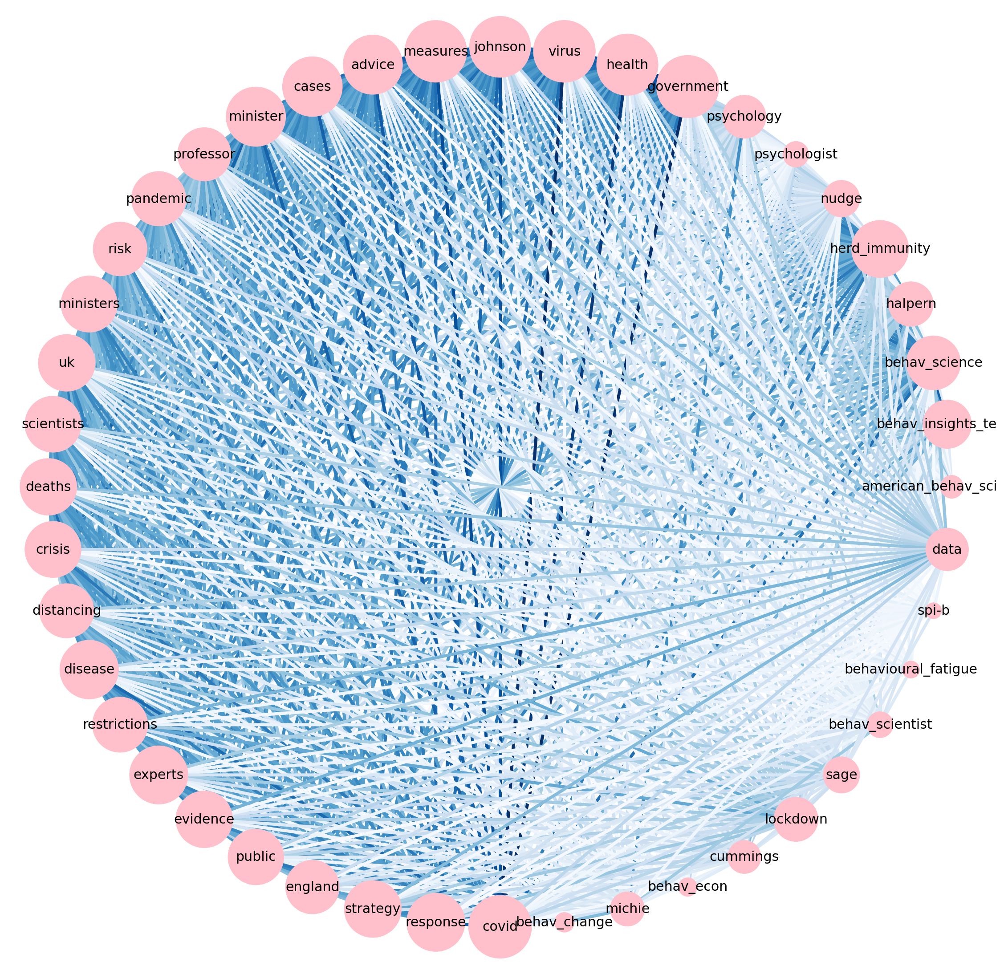

In [103]:
fig, ax = plt.subplots(figsize=(40,40))   
nx.draw(before_dice_graph, 
                 pos=pos,
                 with_labels=True, 
                 edge_color=before_dice_graph_weights,
                 width=7,
                 node_color='pink',
        node_size=[v * 1000 for v in before_dice_graph_degrees.values()],
                 font_size=30,
                 font_color='black',
                 font_weight=3,
                 edge_cmap=plt.cm.Blues
                )

### During lockdown

In [104]:
# drop NaN cases and 0.0 values
lock_dice_coefs.dropna(inplace=True)

In [105]:
lock_dice_coefs = lock_dice_coefs[lock_dice_coefs.lock_weight > 0.0]

In [106]:
lock_dice_graph = nx.from_pandas_edgelist(lock_dice_coefs[['source', 'target', 'lock_weight']], edge_attr=True)

In [107]:
# check nodes
sorted(lock_dice_graph.nodes)

['advice',
 'american_behav_scientists',
 'behav_change',
 'behav_econ',
 'behav_insights_team',
 'behav_science',
 'behav_scientist',
 'behavioural_fatigue',
 'cases',
 'covid',
 'crisis',
 'cummings',
 'data',
 'deaths',
 'disease',
 'distancing',
 'england',
 'evidence',
 'experts',
 'government',
 'halpern',
 'health',
 'herd_immunity',
 'johnson',
 'lockdown',
 'measures',
 'michie',
 'minister',
 'ministers',
 'nudge',
 'pandemic',
 'professor',
 'psychologist',
 'psychology',
 'public',
 'response',
 'restrictions',
 'risk',
 'sage',
 'scientists',
 'spi-b',
 'strategy',
 'uk',
 'virus']

In [108]:
sorted(before_dice_graph.nodes)

['advice',
 'american_behav_scientists',
 'behav_change',
 'behav_econ',
 'behav_insights_team',
 'behav_science',
 'behav_scientist',
 'behavioural_fatigue',
 'cases',
 'covid',
 'crisis',
 'cummings',
 'data',
 'deaths',
 'disease',
 'distancing',
 'england',
 'evidence',
 'experts',
 'government',
 'halpern',
 'health',
 'herd_immunity',
 'johnson',
 'lockdown',
 'measures',
 'michie',
 'minister',
 'ministers',
 'nudge',
 'pandemic',
 'professor',
 'psychologist',
 'psychology',
 'public',
 'response',
 'restrictions',
 'risk',
 'sage',
 'scientists',
 'spi-b',
 'strategy',
 'uk',
 'virus']

In [109]:
# take a look at one
print(nx.to_dict_of_dicts(lock_dice_graph).get('michie'))

{'behav_change': {'lock_weight': 0.5142857142857142}, 'behav_insights_team': {'lock_weight': 0.02631578947368421}, 'behav_science': {'lock_weight': 0.12359550561797752}, 'behav_scientist': {'lock_weight': 0.05}, 'halpern': {'lock_weight': 0.031746031746031744}, 'herd_immunity': {'lock_weight': 0.10869565217391304}, 'psychologist': {'lock_weight': 0.16216216216216217}, 'psychology': {'lock_weight': 0.24242424242424243}, 'spi-b': {'lock_weight': 0.07407407407407407}, 'government': {'lock_weight': 0.35471698113207545}, 'health': {'lock_weight': 0.34959349593495936}, 'virus': {'lock_weight': 0.3211009174311927}, 'johnson': {'lock_weight': 0.3076923076923077}, 'measures': {'lock_weight': 0.41379310344827586}, 'lockdown': {'lock_weight': 0.24752475247524752}, 'sage': {'lock_weight': 0.4782608695652174}, 'advice': {'lock_weight': 0.3515151515151515}, 'cases': {'lock_weight': 0.3089430894308943}, 'minister': {'lock_weight': 0.29333333333333333}, 'professor': {'lock_weight': 0.43820224719101125

In [110]:
# extract weights, we'll use them for plotting
lock_dice_weights = list(nx.get_edge_attributes(lock_dice_graph,'lock_weight').values())

In [111]:
# calculate nodes' degree to use as node size
lock_dice_graph_degrees = dict(nx.degree(lock_dice_graph, weight='lock_weight'))
lock_dice_graph_degrees

{'american_behav_scientists': 3.7057133621257474,
 'behav_change': 6.477521617682016,
 'behav_econ': 3.4084479985911527,
 'behav_insights_team': 7.398762109616659,
 'behav_science': 15.958920291329102,
 'behav_scientist': 5.071922908748376,
 'behavioural_fatigue': 2.3456876346567217,
 'halpern': 6.178667263403604,
 'herd_immunity': 12.484334552746459,
 'nudge': 5.782535883868323,
 'psychologist': 5.397370440875498,
 'psychology': 10.075067912538335,
 'government': 21.0548524081372,
 'health': 20.05076919033501,
 'virus': 20.12052116987463,
 'johnson': 17.824024508602857,
 'measures': 19.170668633159913,
 'lockdown': 18.876989228770615,
 'sage': 17.282525708644062,
 'advice': 18.314092228229683,
 'minister': 17.152863704526627,
 'professor': 17.500017871063452,
 'pandemic': 18.87345937973653,
 'risk': 17.60334697699306,
 'ministers': 18.294757954322403,
 'uk': 16.906002988734905,
 'scientists': 17.464786533012656,
 'deaths': 16.689273582816202,
 'crisis': 14.999886227754184,
 'distancin

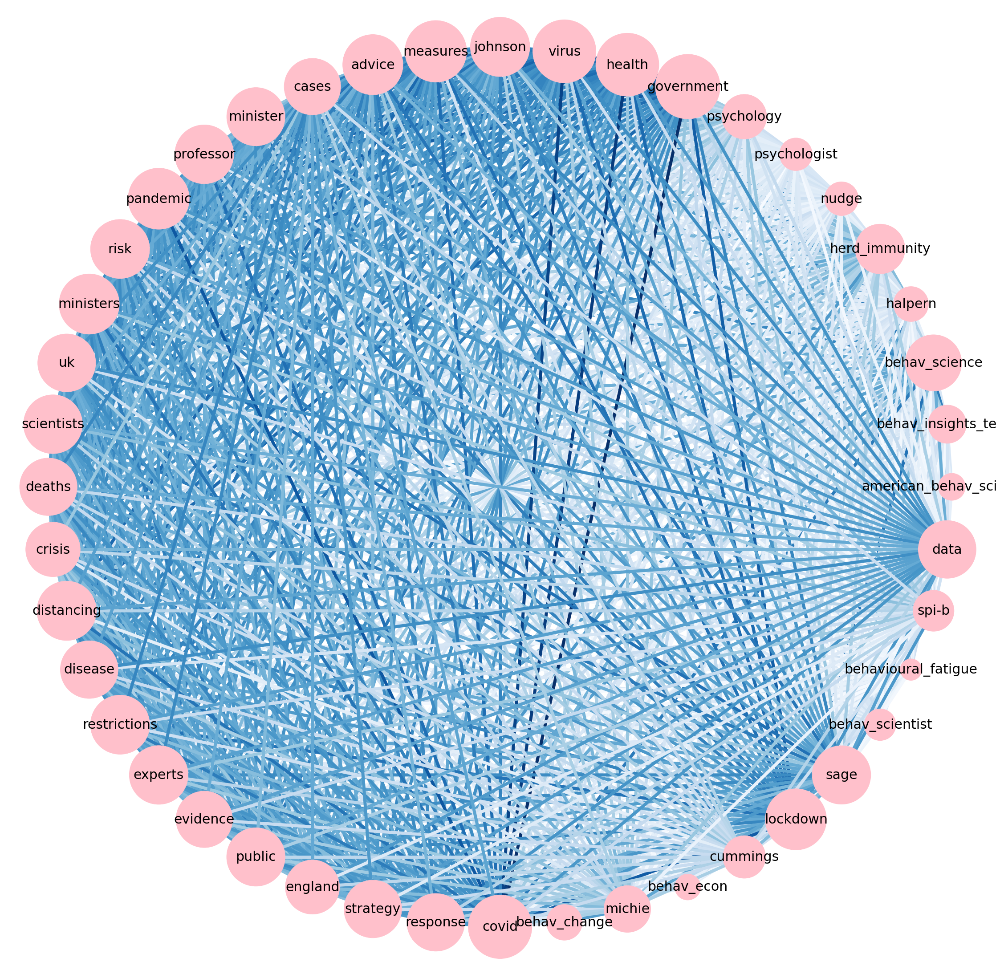

In [113]:
fig, ax = plt.subplots(figsize=(40,40))   
nx.draw(lock_dice_graph, 
        pos=pos,
                 with_labels=True, 
                 edge_color=lock_dice_weights,
                 width=7,
                 node_color='pink',
        node_size=[v * 1000 for v in lock_dice_graph_degrees.values()],
                 font_size=30,
                 font_color='black',
                 font_weight=3,
                 edge_cmap=plt.cm.Blues
                )

## After strict lockdown

In [114]:
post_dice_coefs.dropna(inplace=True)

In [115]:
post_dice_coefs = post_dice_coefs[post_dice_coefs.post_weight > 0.0]

In [116]:
post_dice_graph = nx.from_pandas_edgelist(post_dice_coefs[['source', 'target', 'post_weight']], edge_attr=True)

In [117]:
# take a look at one
print(nx.to_dict_of_dicts(post_dice_graph).get('michie'))

{'behav_change': {'post_weight': 0.46875}, 'behav_science': {'post_weight': 0.21686746987951808}, 'behav_scientist': {'post_weight': 0.14285714285714285}, 'herd_immunity': {'post_weight': 0.08955223880597014}, 'psychologist': {'post_weight': 0.24}, 'psychology': {'post_weight': 0.3516483516483517}, 'spi-b': {'post_weight': 0.1702127659574468}, 'government': {'post_weight': 0.40540540540540543}, 'health': {'post_weight': 0.36923076923076925}, 'virus': {'post_weight': 0.37209302325581395}, 'johnson': {'post_weight': 0.37735849056603776}, 'measures': {'post_weight': 0.32857142857142857}, 'lockdown': {'post_weight': 0.26285714285714284}, 'sage': {'post_weight': 0.4155844155844156}, 'advice': {'post_weight': 0.425}, 'cases': {'post_weight': 0.2}, 'minister': {'post_weight': 0.323943661971831}, 'professor': {'post_weight': 0.43478260869565216}, 'pandemic': {'post_weight': 0.2634730538922156}, 'risk': {'post_weight': 0.33548387096774196}, 'ministers': {'post_weight': 0.37583892617449666}, 'uk

In [118]:
# extract weights, we'll use them for plotting
post_dice_weights = list(nx.get_edge_attributes(post_dice_graph,'post_weight').values())

In [119]:
# calculate nodes' degree to use as node size
post_dice_graph_degrees = dict(nx.degree(post_dice_graph, weight='post_weight'))
post_dice_graph_degrees

{'american_behav_scientists': 1.8524698437055824,
 'behav_insights_team': 3.770788865080146,
 'behav_science': 16.514266413732145,
 'behav_scientist': 5.486421397748408,
 'behavioural_fatigue': 2.351063340840082,
 'halpern': 3.4887270502375816,
 'herd_immunity': 7.3894644927891795,
 'nudge': 3.588503451173951,
 'psychologist': 7.174789328439357,
 'psychology': 9.619805150469604,
 'government': 20.910333202150955,
 'virus': 19.53867807945931,
 'johnson': 18.60812821093282,
 'lockdown': 19.390040751858443,
 'sage': 19.70712068970985,
 'advice': 18.745464170597874,
 'minister': 17.175489834768207,
 'professor': 18.698165353385992,
 'pandemic': 18.208589225965724,
 'risk': 17.12372462858418,
 'ministers': 18.380207019456595,
 'uk': 17.29627514834558,
 'scientists': 18.51622499422781,
 'deaths': 14.408435058131724,
 'crisis': 16.395185138116723,
 'distancing': 16.46921822744739,
 'disease': 15.594218440912156,
 'cummings': 11.206776418555595,
 'evidence': 16.235217377439618,
 'response': 15

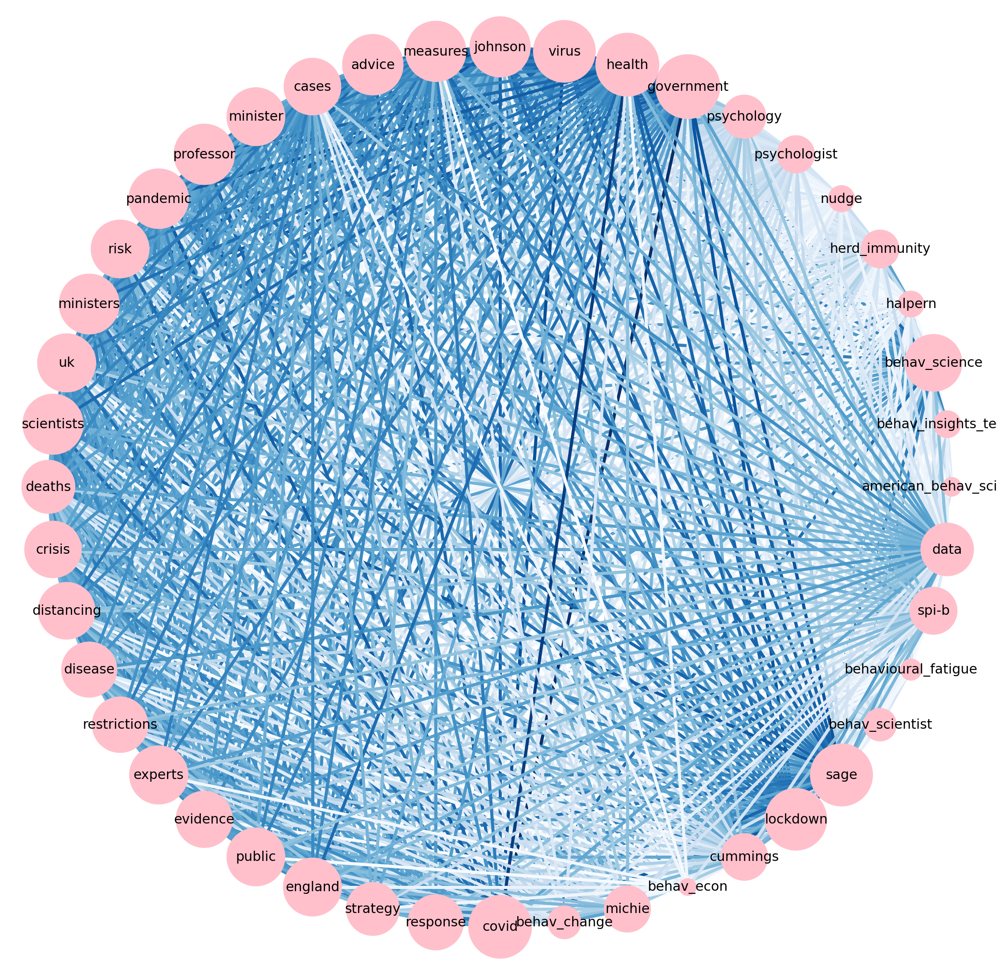

In [121]:
fig, ax = plt.subplots(figsize=(40,40))   
nx.draw(post_dice_graph, 
        pos=pos,
                 with_labels=True, 
                 edge_color=post_dice_weights,
                 width=7,
                 node_color='pink',
        node_size=[v * 1000 for v in post_dice_graph_degrees.values()],
                 font_size=30,
                 font_color='black',
                 font_weight=3,
                 edge_cmap=plt.cm.Blues
                )

## Characteristics of the three networks and nodes

Main ref: https://programminghistorian.org/en/lessons/exploring-and-analyzing-network-data-with-python

### Number of nodes (keywords that co-occured)

In [122]:
print("Number of keywords co-occurring before-lockdown:", len(before_dice_graph.nodes))

Number of keywords co-occurring before-lockdown: 44


In [123]:
print("Number of keywords co-occurring during-lockdown:", len(lock_dice_graph.nodes))

Number of keywords co-occurring during-lockdown: 44


In [124]:
print("Number of keywords co-occurring post-lockdown:", len(post_dice_graph.nodes))

Number of keywords co-occurring post-lockdown: 44


### Network density

Network density
= ratio between actual number of connections between nodes and maximum possible number of connections.

Give a sense of how closely knit the network is, a higher value (within [0,1]) indicates a more cohesive network, so a set of keywords that do tend to co-occur.



In [125]:
before_density = nx.density(before_dice_graph)
print("Network density (before lockdown):", before_density)

Network density (before lockdown): 0.8995771670190275


In [126]:
lock_density = nx.density(lock_dice_graph)
print("Network density (during lockdown):", lock_density)

Network density (during lockdown): 0.9778012684989429


In [127]:
post_density = nx.density(post_dice_graph)
print("Network density (post lockdown):", post_density)

Network density (post lockdown): 0.9429175475687104


- Network density has increased during lockdown compared to pre-lockdown. 
    Interpretation: an increase in the general tendency of keywords to co-occur together in the same documents. 
    
- Network density decreased post lockdown compared to lockdown but remained higher than during pre-lockdown period.

### Network Clustering Coefficient

= n^ of connections between the neighbour nodes of a node / maximum possible number of connections between its neighbour nodes

(neighbour nodes are the nodes directly connected to a node).

A measure of the degree to which nodes in a graph tend to cluster together.

In [128]:
before_clustcoef = nx.average_clustering(before_dice_graph, weight='bef_weights')
print("Network clustering coefficient (before lockdown):", before_clustcoef)

Network clustering coefficient (before lockdown): 0.9340237847333303


In [129]:
lock_clustcoef = nx.average_clustering(lock_dice_graph, weight='lock_weights')
print("Network clustering coefficient (during lockdown):", lock_clustcoef)

Network clustering coefficient (during lockdown): 0.9806754261399445


In [130]:
post_clustcoef = nx.average_clustering(post_dice_graph, weight='lock_weights')
print("Network clustering coefficient (during lockdown):", post_clustcoef)

Network clustering coefficient (during lockdown): 0.9569089130007463


Increased during lockdown and remained higher than pre-lockdown also in the post-lockdown period. 

## Centrality measures

Identify nodes (keywords) that are more important in the networks and compare the ranking them over time.

### Node Degree

The number of connection a node has. For a weighted network, this is the sum of the edge weights adjacent to the node. 

Here is with how many different keywords does each keyword co-occur?
Note that this is likely to be proportional to the keyword's frequency. Something we can also report.

In [ ]:
G.degree(weight='weight').items()

In [131]:
def get_node_degree(graph, weight=None):
    node_degree_dict = {}
    for node in graph.nodes:
        node_degree_dict[node] = nx.degree(graph, node, weight)
    return node_degree_dict    

Before lockdown

In [132]:
before_node_degrees = pd.Series(get_node_degree(before_dice_graph, weight='bef_weight')).sort_values(ascending=False)
print(before_node_degrees)

covid                        20.057634
government                   19.697651
virus                        19.425814
measures                     19.351141
health                       19.086846
johnson                      18.889724
cases                        18.102191
minister                     17.890715
advice                       17.848495
disease                      17.466691
experts                      17.210384
response                     17.161851
herd_immunity                16.509978
strategy                     16.439543
uk                           16.338411
evidence                     16.318598
deaths                       16.274881
ministers                    16.032887
crisis                       15.982115
scientists                   15.954048
public                       15.747014
restrictions                 15.415811
pandemic                     15.028971
distancing                   14.936737
behav_science                14.751022
risk                     

During lockdown

In [133]:
lock_node_degrees = pd.Series(get_node_degree(lock_dice_graph, weight='lock_weight')).sort_values(ascending=False)
print(lock_node_degrees)

government                   21.054852
covid                        20.412084
virus                        20.120521
health                       20.050769
measures                     19.170669
lockdown                     18.876989
pandemic                     18.873459
advice                       18.314092
ministers                    18.294758
johnson                      17.824025
distancing                   17.798158
restrictions                 17.657405
risk                         17.603347
professor                    17.500018
scientists                   17.464787
experts                      17.436842
sage                         17.282526
public                       17.242681
minister                     17.152864
uk                           16.906003
data                         16.848197
strategy                     16.803081
disease                      16.797135
response                     16.796904
deaths                       16.689274
cases                    

Post lockdown

In [134]:
post_node_degrees = pd.Series(get_node_degree(post_dice_graph, weight='post_weight')).sort_values(ascending=False)
print(post_node_degrees)

government                   20.910333
health                       20.309861
covid                        20.200362
sage                         19.707121
virus                        19.538678
lockdown                     19.390041
advice                       18.745464
professor                    18.698165
johnson                      18.608128
measures                     18.606006
scientists                   18.516225
ministers                    18.380207
pandemic                     18.208589
experts                      17.353484
uk                           17.296275
england                      17.248992
minister                     17.175490
public                       17.153288
risk                         17.123725
behav_science                16.514266
cases                        16.476738
distancing                   16.469218
crisis                       16.395185
evidence                     16.235217
restrictions                 15.799419
response                 

In [ ]:
# alternative way to calculate it

In [135]:
before_degree_dict = dict(before_dice_graph.degree(before_dice_graph.nodes(), weight='bef_weight'))
nx.set_node_attributes(before_dice_graph, before_degree_dict, 'degree')

In [136]:
lock_degree_dict = dict(lock_dice_graph.degree(lock_dice_graph.nodes(), weight='lock_weight'))
nx.set_node_attributes(lock_dice_graph, lock_degree_dict, 'degree')

In [137]:
post_degree_dict = dict(post_dice_graph.degree(post_dice_graph.nodes(), weight='post_weight'))
nx.set_node_attributes(post_dice_graph, post_degree_dict, 'degree')

### Node Betweeness Centrality

Betweenness centrality doesn’t care about the number of edges any one node or set of nodes has. Betweenness centrality looks at all the shortest paths that pass through a particular node.

So a keyword with a high betweeness centrality is a keyword that works as a bridge by connecting several different other keywords - i.e., it is discussed in articles with a wider variety of other keywords.

https://networkx.org/documentation/networkx-1.10/reference/generated/networkx.algorithms.centrality.betweenness_centrality.html
for weighted networks

#### Pre-lockdown

In [138]:
before_betweenness_dict = nx.betweenness_centrality(
    before_dice_graph, 
    weight='bef_weights'
    ) 

# Assign each to an attribute in your network
nx.set_node_attributes(before_dice_graph, before_betweenness_dict, 'betweenness')


In [141]:
sorted(before_betweenness_dict.items(), key=itemgetter(1), reverse=True)

[('government', 0.004183535390271728),
 ('health', 0.004183535390271728),
 ('virus', 0.004183535390271728),
 ('johnson', 0.004183535390271728),
 ('measures', 0.004183535390271728),
 ('pandemic', 0.004183535390271728),
 ('uk', 0.004183535390271728),
 ('scientists', 0.004183535390271728),
 ('distancing', 0.004183535390271728),
 ('experts', 0.004183535390271728),
 ('evidence', 0.004183535390271728),
 ('covid', 0.004183535390271728),
 ('disease', 0.003630795359928307),
 ('professor', 0.003456988553390916),
 ('cases', 0.0033120148380350804),
 ('crisis', 0.0033120148380350804),
 ('advice', 0.0032348933786979714),
 ('risk', 0.0032348933786979714),
 ('public', 0.0032348933786979714),
 ('england', 0.0032348933786979714),
 ('behav_science', 0.0028496169871781774),
 ('response', 0.0028075948067088235),
 ('herd_immunity', 0.0026367022625716206),
 ('psychology', 0.002561080813820535),
 ('minister', 0.0024861775712154296),
 ('strategy', 0.0024861775712154296),
 ('deaths', 0.002030830706944906),
 ('r

Compare degree and between centrality

In [ ]:
#Then find and print their degree
for tb in sorted(before_betweenness_dict.items(), key=itemgetter(1), reverse=True): 
    degree = before_degree_dict[tb[0]] # Use degree_dict to access a node's degree
    print("Name:", tb[0], "| Betweenness Centrality:", tb[1], "| Degree:", degree)

#### During lockdown

In [142]:
lock_betweenness_dict = nx.betweenness_centrality(
    lock_dice_graph,
    weight='lock_weights') 

# Assign each to an attribute in your network
nx.set_node_attributes(lock_dice_graph, lock_betweenness_dict, 'betweenness')


sorted(lock_betweenness_dict.items(), key=itemgetter(1), reverse=True)

[('behav_insights_team', 0.0006472575880020619),
 ('behav_science', 0.0006472575880020619),
 ('halpern', 0.0006472575880020619),
 ('psychologist', 0.0006472575880020619),
 ('psychology', 0.0006472575880020619),
 ('government', 0.0006472575880020619),
 ('health', 0.0006472575880020619),
 ('virus', 0.0006472575880020619),
 ('johnson', 0.0006472575880020619),
 ('measures', 0.0006472575880020619),
 ('lockdown', 0.0006472575880020619),
 ('sage', 0.0006472575880020619),
 ('advice', 0.0006472575880020619),
 ('minister', 0.0006472575880020619),
 ('professor', 0.0006472575880020619),
 ('pandemic', 0.0006472575880020619),
 ('risk', 0.0006472575880020619),
 ('ministers', 0.0006472575880020619),
 ('uk', 0.0006472575880020619),
 ('scientists', 0.0006472575880020619),
 ('deaths', 0.0006472575880020619),
 ('crisis', 0.0006472575880020619),
 ('distancing', 0.0006472575880020619),
 ('disease', 0.0006472575880020619),
 ('restrictions', 0.0006472575880020619),
 ('experts', 0.0006472575880020619),
 ('evid

Compare degree and between centrality

In [ ]:
for tb in sorted(lock_betweenness_dict.items(), key=itemgetter(1), reverse=True): 
    degree = lock_degree_dict[tb[0]] # Use degree_dict to access a node's degree
    print("Name:", tb[0], "| Betweenness Centrality:", tb[1], "| Degree:", degree)

#### Post lockdown

In [143]:
post_betweenness_dict = nx.betweenness_centrality(
    post_dice_graph,
    weight='post_weights'
) 

# Assign each to an attribute in your network
nx.set_node_attributes(post_dice_graph, post_betweenness_dict, 'betweenness')


sorted(post_betweenness_dict.items(), key=itemgetter(1), reverse=True)

[('psychology', 0.0020199060640959036),
 ('government', 0.0020199060640959036),
 ('johnson', 0.0020199060640959036),
 ('lockdown', 0.0020199060640959036),
 ('advice', 0.0020199060640959036),
 ('professor', 0.0020199060640959036),
 ('pandemic', 0.0020199060640959036),
 ('risk', 0.0020199060640959036),
 ('scientists', 0.0020199060640959036),
 ('deaths', 0.0020199060640959036),
 ('crisis', 0.0020199060640959036),
 ('disease', 0.0020199060640959036),
 ('evidence', 0.0020199060640959036),
 ('response', 0.0020199060640959036),
 ('covid', 0.0020199060640959036),
 ('virus', 0.001693033511046602),
 ('uk', 0.001693033511046602),
 ('distancing', 0.0016531976811485472),
 ('health', 0.001500711278662145),
 ('measures', 0.001500711278662145),
 ('experts', 0.001500711278662145),
 ('data', 0.001500711278662145),
 ('england', 0.001500711278662145),
 ('strategy', 0.001500711278662145),
 ('minister', 0.0014864330992478319),
 ('behav_science', 0.001392973956110302),
 ('behav_scientist', 0.0013929739561103

In [ ]:
for tb in sorted(post_betweenness_dict.items(), key=itemgetter(1), reverse=True): 
    degree = post_degree_dict[tb[0]] # Use degree_dict to access a node's degree
    print("Name:", tb[0], "| Betweenness Centrality:", tb[1], "| Degree:", degree)

In [144]:
from networkx.algorithms import community

In [147]:
list(community.greedy_modularity_communities(before_dice_graph))

[frozenset({'behav_science',
            'behav_scientist',
            'behavioural_fatigue',
            'cases',
            'crisis',
            'data',
            'deaths',
            'evidence',
            'government',
            'health',
            'herd_immunity',
            'johnson',
            'lockdown',
            'measures',
            'michie',
            'minister',
            'ministers',
            'professor',
            'response',
            'restrictions',
            'sage',
            'spi-b',
            'strategy',
            'virus'}),
 frozenset({'advice',
            'american_behav_scientists',
            'behav_change',
            'behav_econ',
            'behav_insights_team',
            'covid',
            'cummings',
            'disease',
            'distancing',
            'england',
            'experts',
            'halpern',
            'nudge',
            'pandemic',
            'psychologist',
            'psychology'

In [148]:
list(community.greedy_modularity_communities(lock_dice_graph))

[frozenset({'advice',
            'american_behav_scientists',
            'behav_change',
            'behav_econ',
            'behav_insights_team',
            'behav_science',
            'behav_scientist',
            'behavioural_fatigue',
            'cases',
            'covid',
            'crisis',
            'cummings',
            'data',
            'deaths',
            'disease',
            'distancing',
            'england',
            'evidence',
            'experts',
            'government',
            'halpern',
            'health',
            'herd_immunity',
            'johnson',
            'lockdown',
            'measures',
            'michie',
            'minister',
            'ministers',
            'nudge',
            'pandemic',
            'professor',
            'psychologist',
            'psychology',
            'public',
            'response',
            'restrictions',
            'risk',
            'sage',
            'scientists'

In [149]:
list(community.greedy_modularity_communities(post_dice_graph))

[frozenset({'advice',
            'american_behav_scientists',
            'behav_insights_team',
            'behav_science',
            'behav_scientist',
            'behavioural_fatigue',
            'crisis',
            'deaths',
            'disease',
            'evidence',
            'government',
            'halpern',
            'herd_immunity',
            'johnson',
            'lockdown',
            'nudge',
            'pandemic',
            'professor',
            'psychology',
            'risk',
            'sage',
            'scientists'}),
 frozenset({'behav_change',
            'behav_econ',
            'cases',
            'covid',
            'cummings',
            'data',
            'distancing',
            'england',
            'experts',
            'health',
            'measures',
            'michie',
            'minister',
            'ministers',
            'psychologist',
            'public',
            'response',
            'restriction